# Raichle1983Model for Image-Derived Input Functions and Twilite Data

## Setup

In [1]:
# system functions that are always useful to have
import time, sys, os
from pprint import pprint

# basic numeric setup
import numpy as np

from Boxcar import Boxcar
from RadialArtery import RadialArtery
from Raichle1983Model import Raichle1983Model

In [2]:
# define data & models
petdir = os.path.join(os.getenv("HOME"), "PycharmProjects", "dynesty", "idif2024", "data", "ses-20210421152358", "pet")
idif = os.path.join(petdir, "sub-108293_ses-20210421152358_trc-ho_proc-MipIdif_idif_dynesty-Boxcar-ideal.nii.gz")
#idif = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-ho_proc-MipIdif_idif.nii.gz")
#twil = os.path.join(petdir, "sub-108293_ses-20210421150523_trc-ho_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc.nii.gz")
twil = os.path.join(petdir, "sub-108293_ses-20210421152358_trc-ho_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc_dynesty-RadialArtery-ideal.nii.gz")
kern = os.path.join(petdir, "kernel_hct=46.8.nii.gz")
pet = os.path.join(petdir, "sub-108293_ses-20210421152358_trc-ho_proc-BrainMoCo2-createNiftiMovingAvgFrames-ParcWmparc-reshape-to-wmparc-select-all.nii.gz")

mm_twil = Raichle1983Model(twil, 
                     pet,
                     truths=[0.00790, 0.898, 0.0218, 0, 0, 0.05],
                     nlive=100)
mm_idif = Raichle1983Model(idif, 
                     pet,
                     truths=[0.00790, 0.898, 0.0218, 0, 0, 0.05],
                     nlive=100)

RadialArtery: found data for tracer ho
{'fqfp': '/Users/jjlee/PycharmProjects/dynesty/idif2024/data/ses-20210421152358/pet/sub-108293_ses-20210421152358_trc-ho_proc-TwiliteKit-do-make-input-func-nomodel_inputfunc_dynesty-RadialArtery-ideal',
 'halflife': 122.2416,
 'img': array([     0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,      0.        ,
            0.        ,      0.        ,      0.        ,   1856.07746711,
        10631.744982  ,  30295.35118695,  62027.11728402, 106439.34760018,
       163652.50312036, 233083.94387916, 313260.83487576, 401880.71519898,
       494038.15678544, 580762.45862061, 649921.71210954, 688084.3992167 ,
       684223.55474484, 634800.51989303, 547934.99765338, 443129.07761613,
       344403.88211575, 269467.36133061, 222147.89096646, 193903.0568143 ,
       172431.46698455, 149626.10575786, 123779.9648

## Inspect Raichle1983Model twil

In [3]:
v = mm_twil.truths
pprint("===================================== v ======================================")
pprint(v)

data = mm_twil.data(v)
pprint("==================================== data ====================================")
pprint(data)

'===================================== v ======================================'
[0.0079, 0.898, 0.0218, 0, 0, 0.05]
'==================================== data ===================================='
{'halflife': 122.2416,
 'inputFuncInterp': array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.0489182 ,  0.28020695,  0.7984548 ,  1.63476731,  2.80528217,
        4.3131742 ,  6.14308755,  8.25620462, 10.59184248, 13.02071519,
       15.30639378, 17.12913344, 18.13493729, 18.03318208, 16.73060403,
       14.44120348, 11.67897142,  9.07700104,  7.10199752,  5.85486036,
        5.11044834,  4.54454983,  3.94349886,  3.26230605,  2.56539838,
        1.94505635,  1.46727651,  1.15092823,  0.97350028,  0.8919716 ,
        0.86425439,  0.86095502,  0.86637151,  0.87396797,  0.88163417,
        0.8888574 ,  0.89555927,  0.901

In [4]:
pprint("============================== mm_twil.data2t(data) ===============================")
pprint(mm_twil.data2t(data))
pprint("============================= mm_twil.data2taus(data) =============================")
pprint(mm_twil.data2taus(data))
pprint("=========================== mm_twil.data2timesMid(data) ===========================")
pprint(mm_twil.data2timesMid(data))
pprint("================================== mm_twil.fqfp ===================================")
pprint(mm_twil.fqfp)
pprint("========================== mm_twil.input_function() =========================")
pprint(mm_twil.input_function())
pprint("================================= mm_twil.labels ==================================")
pprint(mm_twil.labels)
pprint("====================== mm_twil.load_nii(mm_twil.fqfp + '.nii.gz') ======================")
pprint(mm_twil.load_nii(mm_twil.fqfp + ".nii.gz"))
pprint("=============================== mm_twil.loglike(v) ================================")
pprint(mm_twil.loglike(v))
pprint("================================== mm_twil.ndim ===================================")
pprint(mm_twil.ndim)
pprint("========================= mm_twil.parse_halflife(mm_twil.fqfp) =========================")
pprint(mm_twil.parse_halflife(mm_twil.fqfp))
pprint("========================= mm_twil.parse_isotope(mm_twil.fqfp) ==========================")
pprint(mm_twil.parse_isotope(mm_twil.fqfp))
pprint("================================== mm_twil.sigma ==================================")
pprint(mm_twil.sigma)
pprint("============================ mm_twil.signalmodel(data) ============================")
pprint(mm_twil.signalmodel(data))

('============================== mm_twil.data2t(data) '
 '===============================')
array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118.])
('============================= mm_twil.data2taus(data) '
 '=============================')
array([10., 10., 10., 10

## Plot Raichle1983Model twil

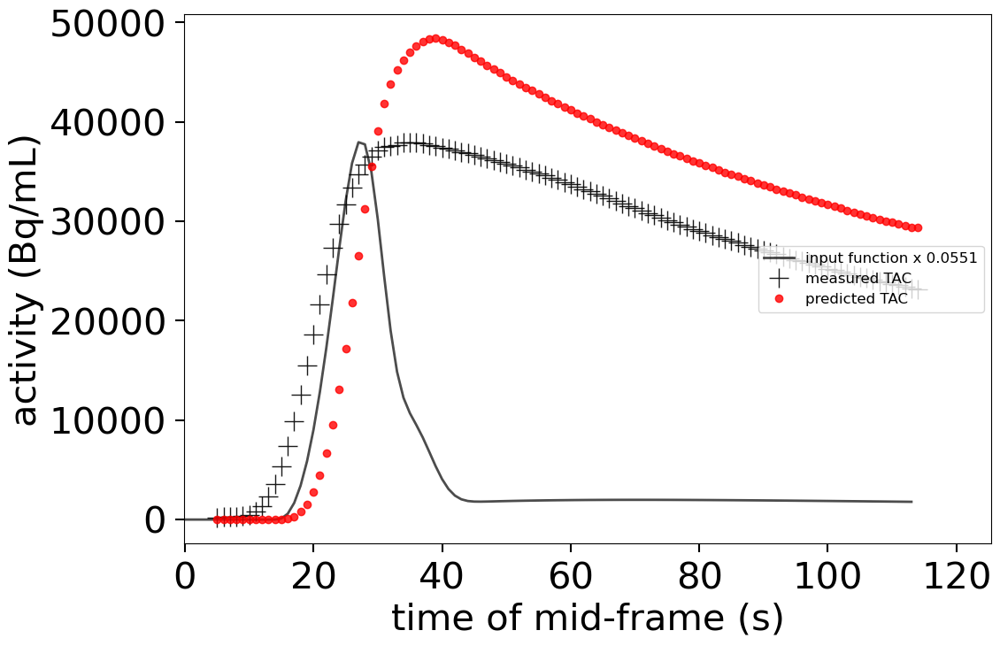

In [5]:
mm_twil.plot_truths()

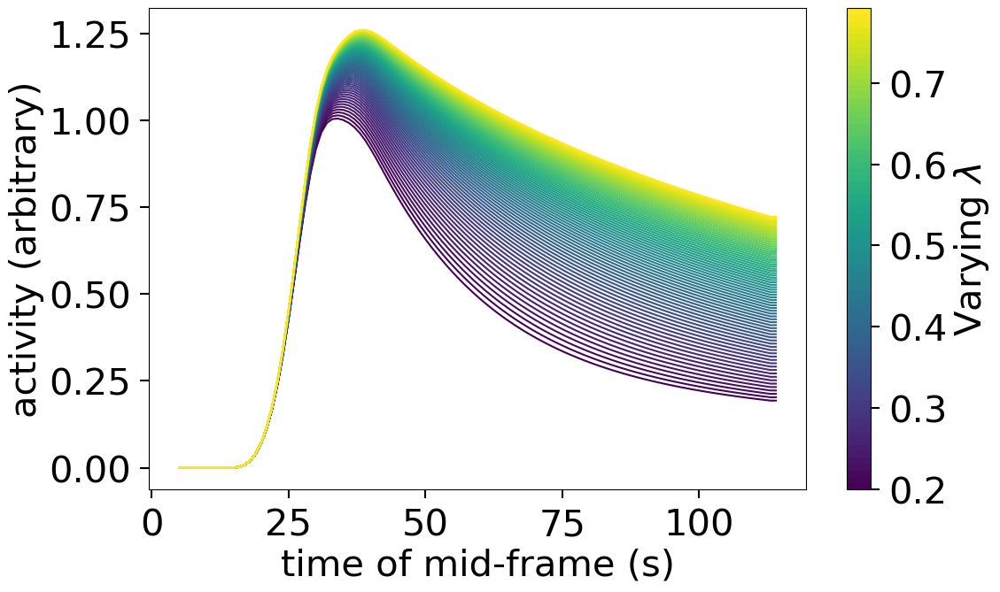

In [6]:
mm_twil.plot_variations(1, 0.2, 0.8 , mm_twil.truths)

Let's sample from this distribution using the default `dynesty` settings with `'slice'`.

iter: 14290 | batch: 21 | bound: 8 | nc: 1 | ncall: 728896 | eff(%):  1.946 | loglstar: 252.208 < 256.364 < 255.003 | logz: 237.215 +/-  0.136 | stop:  0.974                                         

Parameter 0: 0.006 [0.006, 0.008]
Parameter 1: 0.796 [0.770, 0.825]
Parameter 2: 0.016 [0.010, 0.028]
Parameter 3: 10.239 [9.047, 11.599]
Parameter 4: -16.377 [-17.762, -15.194]
Parameter 5: 0.024 [0.021, 0.028]
Parameter 0: 0.006 [0.006, 0.008]
Parameter 1: 0.796 [0.770, 0.825]
Parameter 2: 0.016 [0.010, 0.028]
Parameter 3: 10.239 [9.047, 11.599]
Parameter 4: -16.377 [-17.762, -15.194]
Parameter 5: 0.024 [0.021, 0.028]


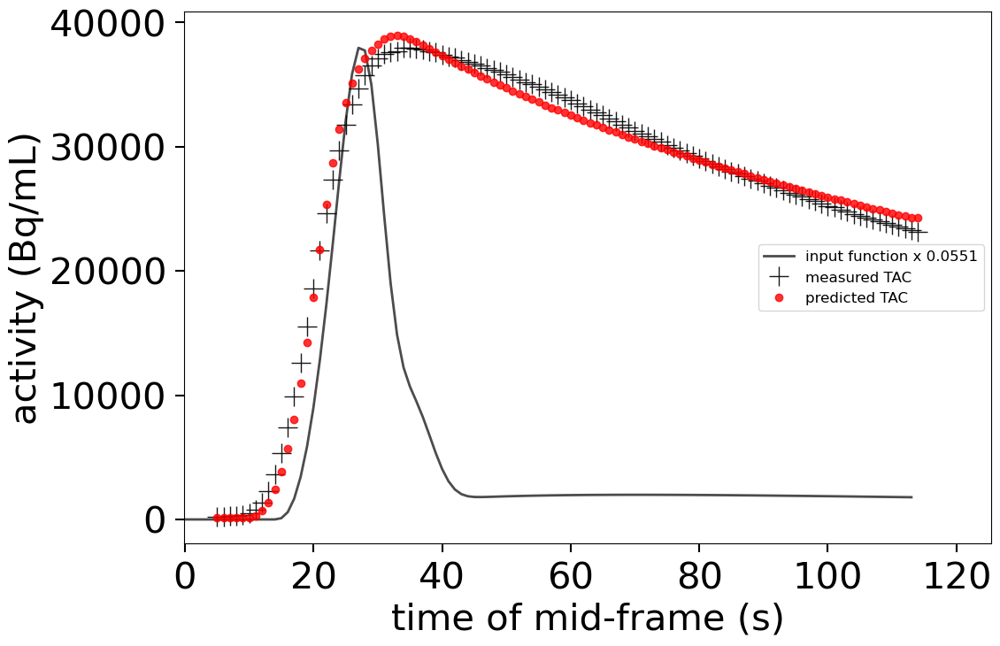

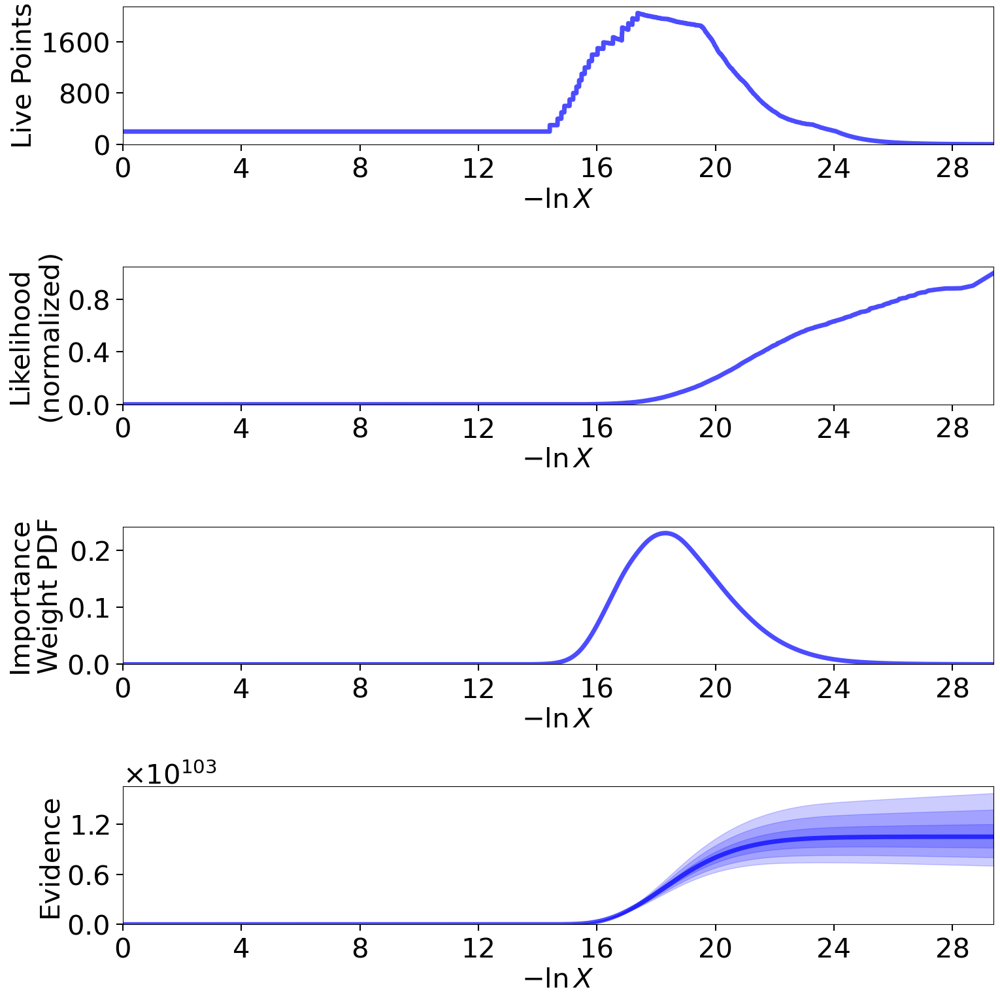

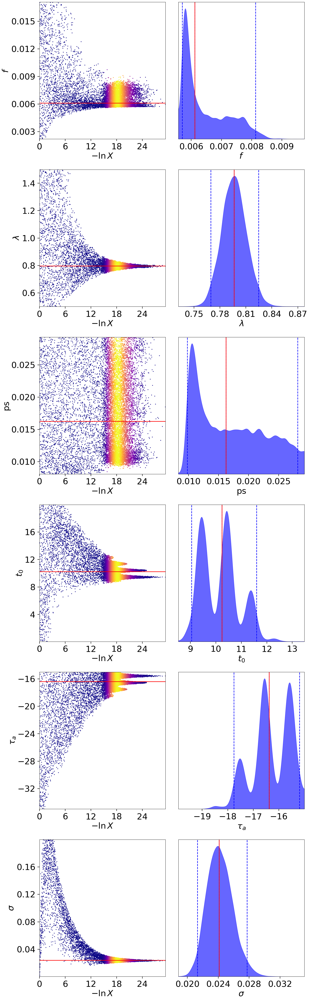

In [7]:
# de novo
res_twil = mm_twil.run_nested(print_progress=True)

# # restart
# sampler = dynesty.DynamicNestedSampler.restore(mm_twil.fqfp+"_dynesty-Boxcar-20240122210738.save")
# sampler.run_nested(resume=True, print_progress=True)
# res = sampler.results

## Inspect Raichle1983Model idif

In [8]:
v = mm_idif.truths
pprint("===================================== v ======================================")
pprint(v)

data = mm_idif.data(v)
pprint("==================================== data ====================================")
pprint(data)

'===================================== v ======================================'
[0.0079, 0.898, 0.0218, 0, 0, 0.05]
'==================================== data ===================================='
{'halflife': 122.2416,
 'inputFuncInterp': array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  1.37645918,
        4.89683498,  8.43547507, 10.78854261, 12.26413759, 12.82189052,
       12.4316604 , 11.17899648,  9.29730529,  7.45554442,  5.85100613,
        4.37205459,  3.26517928,  2.53845022,  2.09986167,  1.83387838,
        1.65004397,  1.49748491,  1.35673833,  1.22520017,  1.10602752,
        1.00252894,  0.91632302,  0.84724558,  0.79382787,  0.75385315,
        0.79639625,  0.87651412,  0.90683504,  0.91885623,  0.91815969,
        0.90818038,  0.89161875,  0.87072719,  0.84737158,  0.82304859,
        0.79890477,  0.77576742,  0.754

In [9]:
pprint("============================== mm_idif.data2t(data) ===============================")
pprint(mm_idif.data2t(data))
pprint("============================= mm_idif.data2taus(data) =============================")
pprint(mm_idif.data2taus(data))
pprint("=========================== mm_idif.data2timesMid(data) ===========================")
pprint(mm_idif.data2timesMid(data))
pprint("================================== mm_idif.fqfp ===================================")
pprint(mm_idif.fqfp)
pprint("========================== mm_idif.input_function() =========================")
pprint(mm_idif.input_function())
pprint("================================= mm_idif.labels ==================================")
pprint(mm_idif.labels)
pprint("====================== mm_idif.load_nii(mm_idif.fqfp + '.nii.gz') ======================")
pprint(mm_idif.load_nii(mm_idif.fqfp + ".nii.gz"))
pprint("=============================== mm_idif.loglike(v) ================================")
pprint(mm_idif.loglike(v))
pprint("================================== mm_idif.ndim ===================================")
pprint(mm_idif.ndim)
pprint("========================= mm_idif.parse_halflife(mm_idif.fqfp) =========================")
pprint(mm_idif.parse_halflife(mm_idif.fqfp))
pprint("========================= mm_idif.parse_isotope(mm_idif.fqfp) ==========================")
pprint(mm_idif.parse_isotope(mm_idif.fqfp))
pprint("================================== mm_idif.sigma ==================================")
pprint(mm_idif.sigma)
pprint("============================ mm_idif.signalmodel(data) ============================")
pprint(mm_idif.signalmodel(data))

('============================== mm_idif.data2t(data) '
 '===============================')
array([  0.,   1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,
        11.,  12.,  13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,
        22.,  23.,  24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,
        33.,  34.,  35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,
        44.,  45.,  46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,
        55.,  56.,  57.,  58.,  59.,  60.,  61.,  62.,  63.,  64.,  65.,
        66.,  67.,  68.,  69.,  70.,  71.,  72.,  73.,  74.,  75.,  76.,
        77.,  78.,  79.,  80.,  81.,  82.,  83.,  84.,  85.,  86.,  87.,
        88.,  89.,  90.,  91.,  92.,  93.,  94.,  95.,  96.,  97.,  98.,
        99., 100., 101., 102., 103., 104., 105., 106., 107., 108., 109.,
       110., 111., 112., 113., 114., 115., 116., 117., 118.])
('============================= mm_idif.data2taus(data) '
 '=============================')
array([10., 10., 10., 10

## Plot Raichle1983Model idif

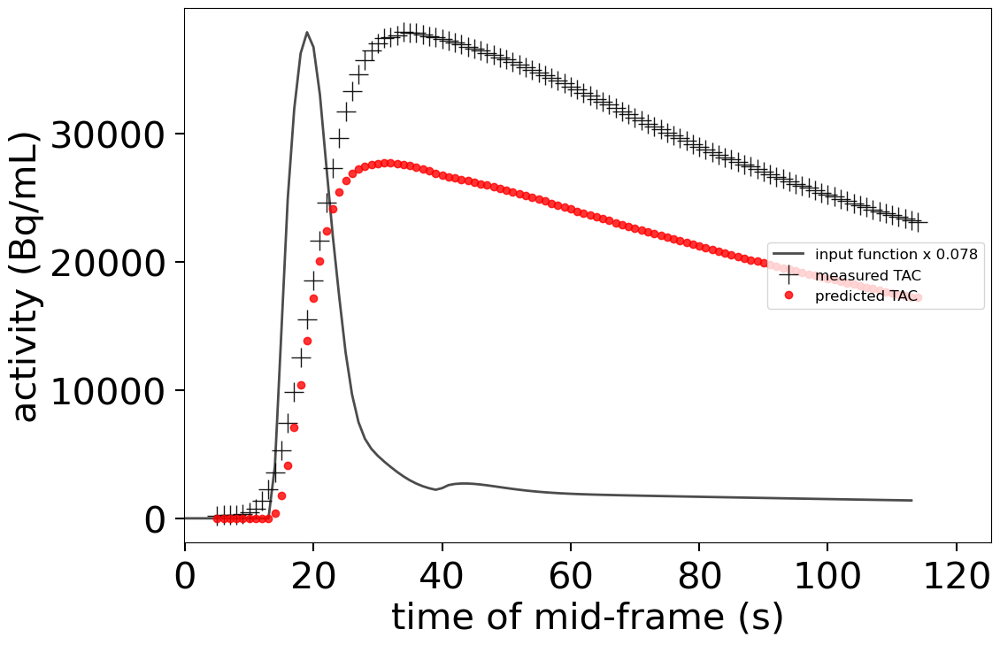

In [10]:
mm_idif.plot_truths()

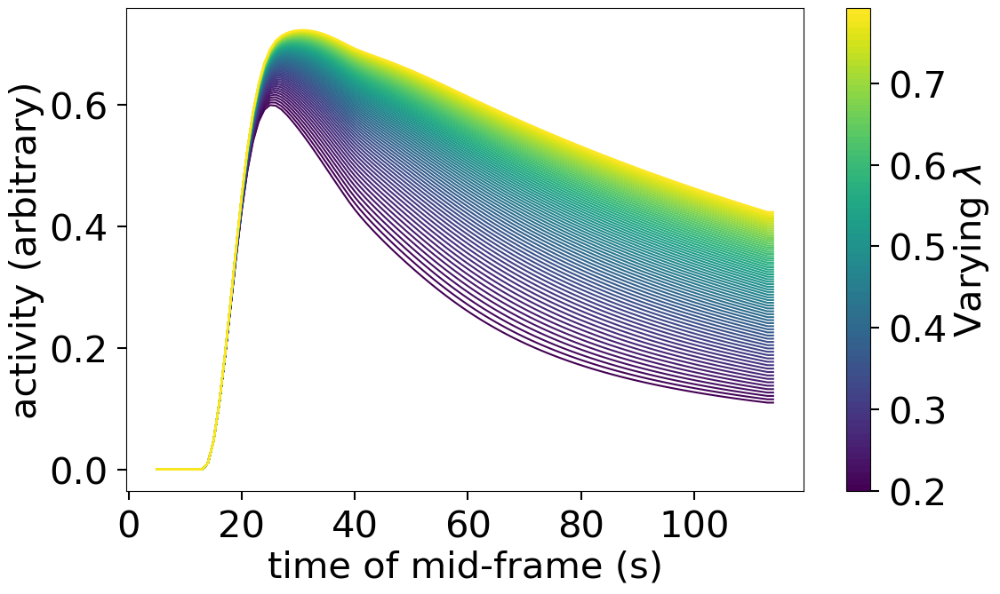

In [11]:
mm_idif.plot_variations(1, 0.2, 0.8 , mm_idif.truths)

Let's sample from this distribution using the default `dynesty` settings with `'slice'`.

iter: 14063 | batch: 20 | bound: 10 | nc: 1 | ncall: 679106 | eff(%):  2.055 | loglstar: 218.160 < 222.835 < 221.032 | logz: 203.280 +/-  0.143 | stop:  0.991                                        

Parameter 0: 0.012 [0.011, 0.017]
Parameter 1: 1.252 [1.200, 1.313]
Parameter 2: 0.021 [0.016, 0.029]
Parameter 3: 15.935 [15.614, 16.416]
Parameter 4: -15.097 [-15.419, -15.004]
Parameter 5: 0.033 [0.029, 0.038]
Parameter 0: 0.012 [0.011, 0.017]
Parameter 1: 1.252 [1.200, 1.313]
Parameter 2: 0.021 [0.016, 0.029]
Parameter 3: 15.935 [15.614, 16.416]
Parameter 4: -15.097 [-15.419, -15.004]
Parameter 5: 0.033 [0.029, 0.038]


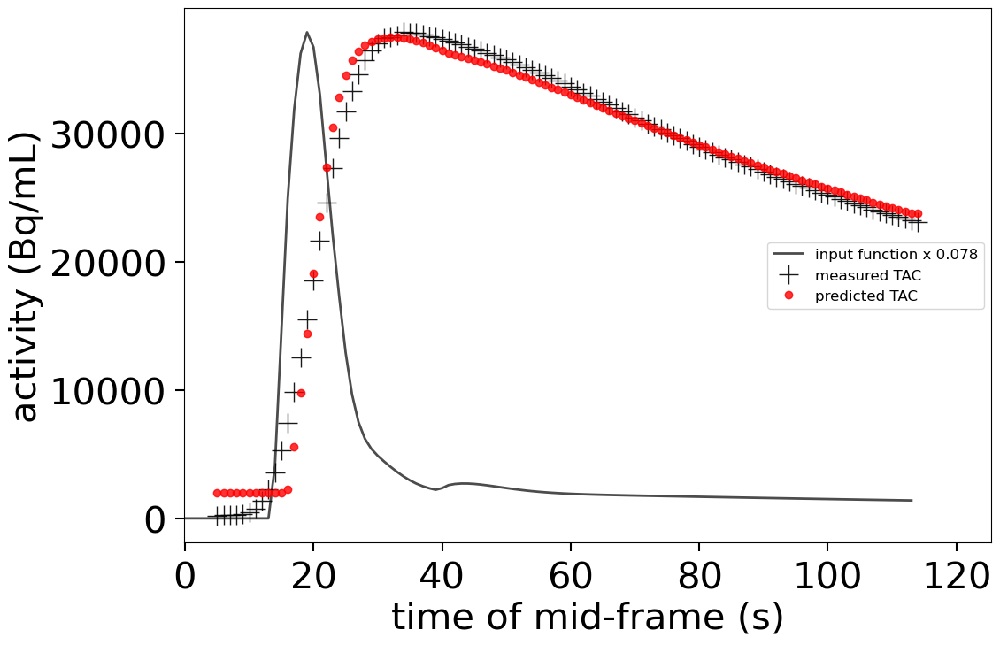

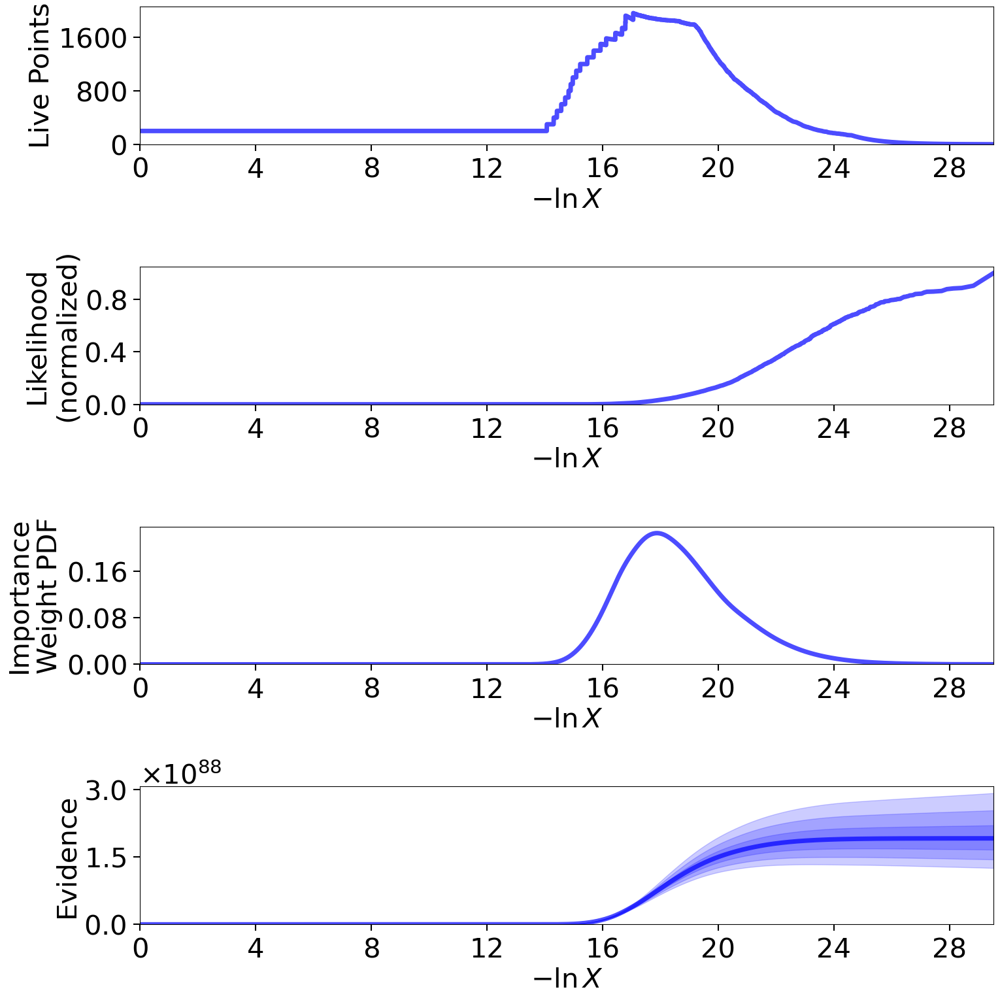

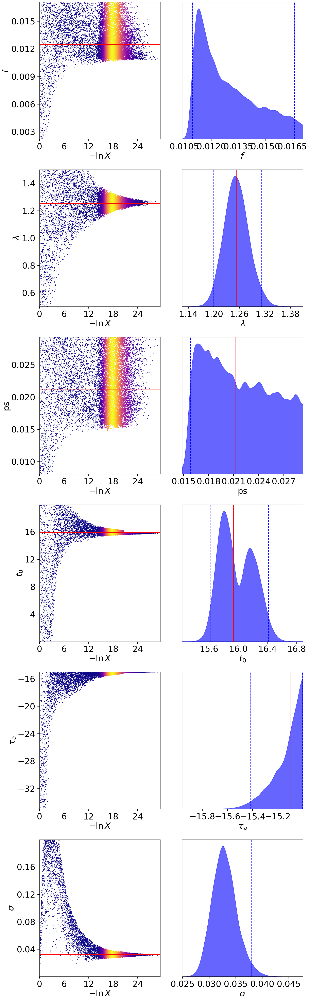

In [12]:
# de novo
res_idif = mm_idif.run_nested(print_progress=True)

# # restart
# sampler = dynesty.DynamicNestedSampler.restore(mm_idif.fqfp+"_dynesty-Boxcar-20240122210738.save")
# sampler.run_nested(resume=True, print_progress=True)
# res = sampler.results